# 혼합 디코더(손=분류, 팔=Cartesian 상대 회귀+역기구학)로 SO-101 팔 + AmazingHand 손 구동

`neural-to-output` 프로젝트와 독립적인 sandbox입니다 (`pyproject.toml`/`uv.lock` 미수정, 다른 노트북들과
같은 `examples` 의존성 그룹만 사용합니다).

**목표**: `04`번은 손+팔 모두 분류(이산 행동)로, `05`번은 손+팔 모두 회귀(절대 관절각)로 구동했습니다.
이 노트북은 **분류 모델 1개 + 회귀 모델 1개, 총 2개의 독립적인 모델을 한 디코더 안에서 섞습니다** —
손은 분류(`"grip"`/`"release"`), 팔은 회귀로 예측한 **Cartesian 상대 이동량**(`dx`, `dy`, 예:
"+0.5cm")을 현재 위치에 더한 뒤 역기구학(inverse kinematics, IK)으로 풀어서 구동합니다.

역할 분리는 이전 노트북들과 동일하되, 이번엔 디코더 안에 서로 완전히 독립된 두 모델(공유 trunk
없음, 각자 다른 optimizer/loss)이 들어갑니다:

1. **`Decoder`** (`MixedDecoder`) — `HandGestureClassifier`(분류)와 `ArmOffsetRegressor`(회귀) 두
   독립 모델을 감싸서, 순수하게 `{"hand_class": 0 | 1, "dx": meters, "dy": meters}`를 예측만
   합니다. `config.type`을 `(DecoderType.CLASSIFICATION, DecoderType.REGRESSION)` 튜플로
   표시합니다. `dx`/`dy`는 현재 위치를 기준으로 한 **상대** 이동량이지, 미리 정해둔 절대 좌표가
   아닙니다.
2. **`MixedCommand`** — `hand_class`를 `"grip"`/`"release"` 이름으로 바꾸고(이미 자기 설명적인
   이름이 되므로 그대로 전달), `dx`/`dy`는 raw 회귀 값이므로 `(ActionType.CARTESIAN_RELATIVE,
   {"dx": ..., "dy": ...})` 튜플로 태그합니다.
3. **`n2o.robot.controller.Controller`** — 손 쪽은 `04`번과 동일한 이산 조회 테이블. 팔 쪽은
   `self.arm_sim.data.site_xpos`에서 **현재 위치를 직접 읽어** `(dx, dy)`를 더한 목표점을 감쇠
   최소제곱(damped least squares) IK로 `shoulder_pan`/`shoulder_lift`/`elbow_flex` 관절 각도로
   풀어내고, 그 과정에서 매 반복마다 공식 가동범위로 clamp합니다 — 벤더가 제공하는 안전장치가
   없다는 사실을 이 프로젝트에서 반복해서 확인했으므로, IK 자체가 그 안전장치 역할을 겸합니다.

로봇 모델은 이전 노트북들과 동일하게 공식 CAD 출처를 그대로 사용합니다 (`assets/so101/`,
`assets/amazing_hand_right/`). 이 노트북도 **시뮬레이션만** 다루며, 실제 하드웨어에는 어떤 명령도
보내지 않습니다.

In [1]:
import os

os.environ.setdefault(
    "MUJOCO_GL", "egl"
)  # 디스플레이 없는 환경에서도 오프스크린 렌더링

import matplotlib.pyplot as plt
import mujoco
import numpy as np
import torch
from IPython.display import HTML, display
from matplotlib import animation

from n2o import N2O
from n2o.command import ActionType, Command, CommandConfig
from n2o.decoder import Decoder, DecoderConfig, DecoderType, FeatureType
from n2o.robot.arm import RobotArm
from n2o.robot.controller import Controller
from n2o.robot.hand import RobotHand

SO101_ASSET_DIR = "assets/so101/mjcf"
AH_ASSET_DIR = "assets/amazing_hand_right/mjcf"
ARM_JOINTS = [
    "shoulder_pan",
    "shoulder_lift",
    "elbow_flex",
    "wrist_flex",
    "wrist_roll",
    "gripper",
]
IK_JOINTS = ["shoulder_pan", "shoulder_lift", "elbow_flex"]
HAND_LABELS = ["grip", "release"]

## 1. 합성 신호 생성

`03`/`05`번과 같은 이유로 합성 신호를 사용합니다. 이번엔 신호 하나가 **이산 라벨**(`hand_label`)과
**연속 상대 이동량**(`dx`, `dy`)을 동시에 결정합니다. `dx`/`dy`는 한 번의 명령으로 움직일 수 있는
작은 상대 걸음(최대 ±2cm)이고, 팔 컨트롤러가 매번 현재 위치에 이 값을 더해서 다음 목표를 정합니다.
목표가 미리 IK로 도달 가능성을 확인해둔 사각형(`x ∈ [0.26, 0.34]`, `y ∈ [-0.10, 0.10]`, 고정 높이
`z = 0.15`)을 벗어나지 않도록, 팔 컨트롤러가 매번 그 범위로 clamp합니다.

In [2]:
RNG = np.random.default_rng(0)  # 재현성

N_CHANS = 8
N_TIMES = 250  # 1s @ 250Hz 가정

# 미리 IK로 도달 가능성을 확인해둔 사각형 (아래 3절의 SO101ArmController가 매번 이 범위로 clamp)
ARM_X_RANGE = (0.26, 0.34)
ARM_Y_RANGE = (-0.10, 0.10)
ARM_Z = 0.15
ARM_OFFSET_RANGE = 0.02  # 한 번의 명령으로 움직일 수 있는 최대 상대 이동량 (±2cm)


def make_synthetic_sample():
    """손 라벨(grip/release)과 팔의 상대 이동량 (dx, dy)에 상관된 합성 신호 한 개를 만듭니다.

    실제 프로젝트에서는 이 함수 대신 `n2o.signal.dataset.SignalDataset`의 실제 구현의
    `read()`가 이 자리를 대체합니다.
    """
    hand_idx = RNG.integers(0, 2)
    dx = RNG.uniform(-ARM_OFFSET_RANGE, ARM_OFFSET_RANGE)
    dy = RNG.uniform(-ARM_OFFSET_RANGE, ARM_OFFSET_RANGE)

    dx_norm = (dx + ARM_OFFSET_RANGE) / (2 * ARM_OFFSET_RANGE)
    dy_norm = (dy + ARM_OFFSET_RANGE) / (2 * ARM_OFFSET_RANGE)
    freq = 5 + 3 * hand_idx  # hand_label -> 주파수
    amplitude = 0.5 + 1.0 * dx_norm  # dx -> 진폭
    phase = dy_norm * np.pi  # dy -> 위상

    t = np.linspace(0, 1, N_TIMES, endpoint=False)
    signal = np.stack(
        [
            amplitude * np.sin(2 * np.pi * freq * t + phase)
            + RNG.normal(0, 0.3, N_TIMES)
            for _ in range(N_CHANS)
        ]
    )
    return signal.astype(np.float32), hand_idx, np.array([dx, dy], dtype=np.float32)


X0, hand0, offset0 = make_synthetic_sample()
print("합성 신호 shape (n_chans, n_times):", X0.shape)
print("hand_label:", HAND_LABELS[hand0], " arm offset (dx, dy):", offset0.round(4))

합성 신호 shape (n_chans, n_times): (8, 250)
hand_label: release  arm offset (dx, dy): [-0.0092 -0.0184]


## 2. 학습/검증용 합성 데이터셋 만들기

In [3]:
N_SAMPLES = 200
X_all = np.zeros((N_SAMPLES, N_CHANS, N_TIMES), dtype=np.float32)
hand_all = np.zeros(N_SAMPLES, dtype=np.int64)
offset_all = np.zeros((N_SAMPLES, 2), dtype=np.float32)
for i in range(N_SAMPLES):
    X_all[i], hand_all[i], offset_all[i] = make_synthetic_sample()

n_train = 160
X_train, hand_train, offset_train = (
    X_all[:n_train],
    hand_all[:n_train],
    offset_all[:n_train],
)
X_valid, hand_valid, offset_valid = (
    X_all[n_train:],
    hand_all[n_train:],
    offset_all[n_train:],
)
print(f"train samples: {len(X_train)}, valid samples: {len(X_valid)}")

train samples: 160, valid samples: 40


## 3. `SO101ArmSim` / `AmazingHandSim`: 공식 CAD 시뮬레이션 + `Controller`

손 쪽 `Controller`는 `04`번과 동일한 이산 조회 테이블입니다. 팔 쪽 `Controller`가 이번 노트북의
핵심입니다 — `Command`가 `(ActionType.CARTESIAN_RELATIVE, {"dx": ..., "dy": ...})`로 넘긴 상대
이동량을 받아서, `self.arm_sim.data.site_xpos`로 **현재** `gripperframe` site 위치를 직접 읽고 그
값에 이동량을 더해 다음 목표로 삼습니다. 그 목표를 향해 감쇠 최소제곱(damped least squares) IK를
풀어 `shoulder_pan`/`shoulder_lift`/`elbow_flex` 각도를 구합니다. IK 자체는 애니메이션에 쓰이는
실제 시뮬레이션 상태를 건드리지 않는 별도의 임시(scratch) `MjData`에서 풀고, 매 반복마다 결과를
공식 `jnt_range`로 clamp합니다.

In [4]:
class SO101ArmController(Controller):
    """(dx, dy) Cartesian 상대 이동량을 현재 위치에 더해 감쇠 최소제곱 IK로 관절 각도로
    풀어내는 Controller.

    SO-101 벤더 SDK(lerobot)에는 Cartesian 목표를 직접 받는 함수가 없으므로, 저수준
    관절 목표값을 IK로 직접 계산합니다. 매 반복마다 공식 가동범위로 clamp하므로, 목표가
    닿지 않는 위치라도 관절이 한계를 넘어가지는 않습니다 (도달하지 못하고 한계에서 멈춤).
    """

    def __init__(self, arm_sim):
        self.arm_sim = arm_sim
        self.model = arm_sim.model
        self.site_id = mujoco.mj_name2id(
            self.model, mujoco.mjtObj.mjOBJ_SITE, "gripperframe"
        )
        self.ik_joint_ids = [
            mujoco.mj_name2id(self.model, mujoco.mjtObj.mjOBJ_JOINT, j)
            for j in IK_JOINTS
        ]
        self.ik_qpos_adr = [self.model.jnt_qposadr[jid] for jid in self.ik_joint_ids]
        self.ik_ranges = [self.model.jnt_range[jid] for jid in self.ik_joint_ids]

    def _solve_ik(self, target_xyz, n_iters=100, damping=0.05, step_size=0.5):
        data = mujoco.MjData(self.model)  # 애니메이션용 상태와 분리된 임시 scratch 상태
        for _ in range(n_iters):
            mujoco.mj_forward(self.model, data)
            error = target_xyz - data.site_xpos[self.site_id]
            if np.linalg.norm(error) < 1e-4:
                break
            jacp = np.zeros((3, self.model.nv))
            mujoco.mj_jacSite(self.model, data, jacp, None, self.site_id)
            j_sub = jacp[:, self.ik_qpos_adr]
            jjt = j_sub @ j_sub.T
            delta = j_sub.T @ np.linalg.solve(jjt + damping**2 * np.eye(3), error)
            for k, adr in enumerate(self.ik_qpos_adr):
                data.qpos[adr] += step_size * delta[k]
                lo, hi = self.ik_ranges[k]
                data.qpos[adr] = np.clip(data.qpos[adr], lo, hi)
        mujoco.mj_forward(self.model, data)
        final_error = float(np.linalg.norm(target_xyz - data.site_xpos[self.site_id]))
        joint_angles = {
            j: data.qpos[adr] for j, adr in zip(IK_JOINTS, self.ik_qpos_adr)
        }
        return joint_angles, final_error

    def _go_to(self, target_xyz, title):
        joint_angles, ik_error = self._solve_ik(target_xyz)
        target_ctrl = np.array([joint_angles.get(joint, 0.0) for joint in ARM_JOINTS])
        self.arm_sim._drive_ctrl(
            target_ctrl, f"{title} (residual error={ik_error:.4f}m)"
        )

    def go_home(self):
        """초기 위치를 사거리 중앙으로 맞춰둡니다 — 이후 상대 이동량이 기준으로 삼을 위치."""
        home_xyz = np.array([sum(ARM_X_RANGE) / 2, sum(ARM_Y_RANGE) / 2, ARM_Z])
        joint_angles, _ = self._solve_ik(home_xyz)
        home_ctrl = np.array([joint_angles.get(joint, 0.0) for joint in ARM_JOINTS])
        self.arm_sim.data.ctrl[:] = home_ctrl
        for _ in range(200):  # 애니메이션 없이 조용히 수렴시킴
            mujoco.mj_step(self.model, self.arm_sim.data)

    def apply(self, decoder_type, command):
        _action_type, offset = command
        current_xy = self.arm_sim.data.site_xpos[self.site_id][:2].copy()
        target_x = float(np.clip(current_xy[0] + offset["dx"], *ARM_X_RANGE))
        target_y = float(np.clip(current_xy[1] + offset["dy"], *ARM_Y_RANGE))
        title = (
            f"SO-101 arm (MuJoCo sim) -> relative step dx={offset['dx']:+.3f}, "
            f"dy={offset['dy']:+.3f} (target x={target_x:.3f}, y={target_y:.3f})"
        )
        self._go_to(np.array([target_x, target_y, ARM_Z]), title)


class SO101ArmSim(RobotArm):
    """실제 SO-101 MJCF 모델(MuJoCo, TheRobotStudio/SO-ARM100 공식 출처)의 관절을 직접
    움직여 시각화하는 RobotArm.
    """

    def __init__(self):
        self.input_spec = {"dx": "meters", "dy": "meters"}
        self.model = mujoco.MjModel.from_xml_path(f"{SO101_ASSET_DIR}/scene.xml")
        self.data = mujoco.MjData(self.model)
        self.renderer = mujoco.Renderer(self.model, height=360, width=480)
        self.camera = mujoco.MjvCamera()
        mujoco.mjv_defaultCamera(self.camera)
        self.camera.distance = 0.85
        self.camera.azimuth = 140
        self.camera.elevation = -25
        self.camera.lookat = np.array([0.1, 0.0, 0.08])
        self.controller = SO101ArmController(self)
        self.controller.go_home()

    def _render_frame(self):
        self.renderer.update_scene(self.data, camera=self.camera)
        return self.renderer.render().copy()

    def _drive_ctrl(self, target_ctrl, title):
        start_ctrl = self.data.ctrl.copy()

        frames = []
        n_steps = 60
        for step in range(n_steps):
            alpha = (step + 1) / n_steps
            self.data.ctrl[:] = start_ctrl + alpha * (target_ctrl - start_ctrl)
            mujoco.mj_step(self.model, self.data)
            if step % 3 == 0:
                frames.append(self._render_frame())

        fig, ax = plt.subplots(figsize=(5, 4))
        im = ax.imshow(frames[0])
        ax.axis("off")
        ax.set_title(title, fontsize=7)

        def update(i):
            im.set_data(frames[i])
            return [im]

        anim = animation.FuncAnimation(fig, update, frames=len(frames), interval=60)
        plt.close(fig)
        display(HTML(anim.to_jshtml()))

    def move(self, decoder_type, command):
        self.controller.apply(decoder_type, command)

In [5]:
GESTURE_CTRL = {
    "grip": np.array([1.4, 0.0] * 4),
    "release": np.zeros(8),
}


class AmazingHandController(Controller):
    """04번과 동일한 이산 조회 테이블 — grip/release를 고정 ctrl 값으로 바꿉니다."""

    def __init__(self, hand_sim):
        self.hand_sim = hand_sim

    def apply(self, decoder_type, action):
        target_ctrl = GESTURE_CTRL[action]
        self.hand_sim._drive_ctrl(
            target_ctrl, f"AmazingHand (MuJoCo sim) -> '{action}'"
        )


class AmazingHandSim(RobotHand):
    """실제 AmazingHand MJCF 모델(MuJoCo)의 관절을 직접 움직여 시각화하는 RobotHand."""

    def __init__(self):
        self.input_spec = {"action": "grip | release"}
        self.model = mujoco.MjModel.from_xml_path(f"{AH_ASSET_DIR}/demo_scene.xml")
        self.data = mujoco.MjData(self.model)
        self.renderer = mujoco.Renderer(self.model, height=360, width=480)
        self.camera = mujoco.MjvCamera()
        mujoco.mjv_defaultCamera(self.camera)
        self.camera.distance = 0.35
        self.camera.azimuth = 120
        self.camera.elevation = -20
        self.camera.lookat = np.array([0.0, 0.0, 0.05])
        self.controller = AmazingHandController(self)

    def _render_frame(self):
        self.renderer.update_scene(self.data, camera=self.camera)
        return self.renderer.render().copy()

    def _drive_ctrl(self, target_ctrl, title):
        start_ctrl = self.data.ctrl.copy()

        frames = []
        n_steps = 60
        for step in range(n_steps):
            alpha = (step + 1) / n_steps
            self.data.ctrl[:] = start_ctrl + alpha * (target_ctrl - start_ctrl)
            mujoco.mj_step(self.model, self.data)
            if step % 3 == 0:
                frames.append(self._render_frame())

        fig, ax = plt.subplots(figsize=(5, 4))
        im = ax.imshow(frames[0])
        ax.axis("off")
        ax.set_title(title)

        def update(i):
            im.set_data(frames[i])
            return [im]

        anim = animation.FuncAnimation(fig, update, frames=len(frames), interval=60)
        plt.close(fig)
        display(HTML(anim.to_jshtml()))

    def move(self, decoder_type, command):
        self.controller.apply(decoder_type, command)

## 4. `Decoder` 서브클래스: 완전히 독립된 분류 모델 + 회귀 모델

`N2O`는 디코더 슬롯이 하나뿐이므로, 손(분류)과 팔(회귀)을 함께 예측하려면 한 `Decoder` 안에 두
모델을 둬야 합니다 — 하지만 trunk를 공유하지 않는 **완전히 독립적인** 두 모델(`HandGestureClassifier`,
`ArmOffsetRegressor`)입니다. 각자 자기 optimizer/loss로 따로 학습되므로, 손 예측이 팔 학습에,
팔 예측이 손 학습에 전혀 영향을 주지 않습니다. `decode()`는 여전히 순수 예측만 반환할 뿐, 그 값을
팔/손이 어떻게 쓸지는 전혀 모릅니다. `config.type`을 `(DecoderType.CLASSIFICATION,
DecoderType.REGRESSION)` 튜플로 표시해서 두 하위 모델이 섞여 있음을 나타냅니다.

In [6]:
class HandGestureClassifier(torch.nn.Module):
    """손 제스처만 예측하는 독립 분류 모델."""

    def __init__(self, n_chans, n_times, n_classes):
        super().__init__()
        self.net = torch.nn.Sequential(
            torch.nn.Conv1d(n_chans, 16, kernel_size=9, padding=4),
            torch.nn.ReLU(),
            torch.nn.AdaptiveAvgPool1d(1),
            torch.nn.Flatten(),
            torch.nn.Linear(16, n_classes),
        )

    def forward(self, x):
        return self.net(x)


class ArmOffsetRegressor(torch.nn.Module):
    """팔의 상대 이동량 (dx, dy)만 예측하는 독립 회귀 모델."""

    def __init__(self, n_chans, n_times):
        super().__init__()
        self.net = torch.nn.Sequential(
            torch.nn.Conv1d(n_chans, 16, kernel_size=9, padding=4),
            torch.nn.ReLU(),
            torch.nn.AdaptiveAvgPool1d(1),
            torch.nn.Flatten(),
            torch.nn.Linear(16, 2),  # dx, dy
        )

    def forward(self, x):
        return self.net(x)


class MixedDecoder(Decoder):
    """손 제스처(분류)와 팔의 상대 이동량(회귀)을 각각 독립적인 모델로 예측하는 디코더.

    두 모델은 trunk를 공유하지 않습니다 — 하나의 모델을 두 목적에 억지로 재학습시키는 게 아니라,
    처음부터 완전히 분리된 두 모델을 한 디코더가 감쌀 뿐입니다.
    """

    output_type = FeatureType.ACTION

    def __init__(self, n_chans, n_times):
        self.input_spec = {"n_chans": n_chans, "n_times": n_times}
        self.output_spec = {"hand_class": "0 | 1", "dx": "meters", "dy": "meters"}
        self.config = DecoderConfig(
            type=(DecoderType.CLASSIFICATION, DecoderType.REGRESSION)
        )
        self.classifier = HandGestureClassifier(
            n_chans, n_times, n_classes=len(HAND_LABELS)
        )
        self.regressor = ArmOffsetRegressor(n_chans, n_times)

    def decode(self, signal):
        self.classifier.eval()
        self.regressor.eval()
        with torch.no_grad():
            x = torch.tensor(signal).unsqueeze(0).float()
            class_logits = self.classifier(x)
            offset = self.regressor(x)[0]
        hand_class = int(class_logits.argmax(dim=1).item())
        return {
            "hand_class": hand_class,
            "dx": float(offset[0]),
            "dy": float(offset[1]),
        }


decoder = MixedDecoder(n_chans=N_CHANS, n_times=N_TIMES)
print(decoder.classifier)
print(decoder.regressor)

HandGestureClassifier(
  (net): Sequential(
    (0): Conv1d(8, 16, kernel_size=(9,), stride=(1,), padding=(4,))
    (1): ReLU()
    (2): AdaptiveAvgPool1d(output_size=1)
    (3): Flatten(start_dim=1, end_dim=-1)
    (4): Linear(in_features=16, out_features=2, bias=True)
  )
)
ArmOffsetRegressor(
  (net): Sequential(
    (0): Conv1d(8, 16, kernel_size=(9,), stride=(1,), padding=(4,))
    (1): ReLU()
    (2): AdaptiveAvgPool1d(output_size=1)
    (3): Flatten(start_dim=1, end_dim=-1)
    (4): Linear(in_features=16, out_features=2, bias=True)
  )
)


## 5. `MixedCommand`: 자기 설명적 이름은 그대로, raw 값은 태그해서 전달

`decoded_signal["hand_class"]`는 정수 인덱스라 그 자체로는 의미가 없으므로 `"grip"`/`"release"`
이름으로 바꾼 뒤에는 이미 자기 설명적이라 그대로 전달합니다. 반면 `dx`/`dy`는 raw 회귀 값이라
`(ActionType.CARTESIAN_RELATIVE, {"dx": ..., "dy": ...})` 튜플로 태그해서, 팔의 `Controller`가
"이 값은 상대 이동량이다"라는 것을 알 수 있게 합니다.

In [7]:
HAND_CLASS_TO_LABEL = {0: "grip", 1: "release"}


class MixedCommand(Command):
    """분류 결과는 이름으로, 회귀 결과는 `ActionType.CARTESIAN_RELATIVE`로 태그해서 나눠 보냅니다."""

    def translate(self, decoder, decoded_signal):
        return {
            "type": decoder.config.type,
            "arm": (
                ActionType.CARTESIAN_RELATIVE,
                {"dx": decoded_signal["dx"], "dy": decoded_signal["dy"]},
            ),
            "hand": HAND_CLASS_TO_LABEL[decoded_signal["hand_class"]],
        }


command = MixedCommand()

## 6. 학습 sanity check (두 모델을 각자 따로 학습)

`decoder.classifier`는 `CrossEntropyLoss` + 자기 optimizer로, `decoder.regressor`는 `MSELoss` +
또 다른 optimizer로 완전히 따로 학습시킵니다 — 두 loss를 더해서 하나의 모델을 학습시키던 이전
방식과 달리, 한쪽의 그래디언트가 다른 쪽 파라미터에 전혀 영향을 주지 않습니다.

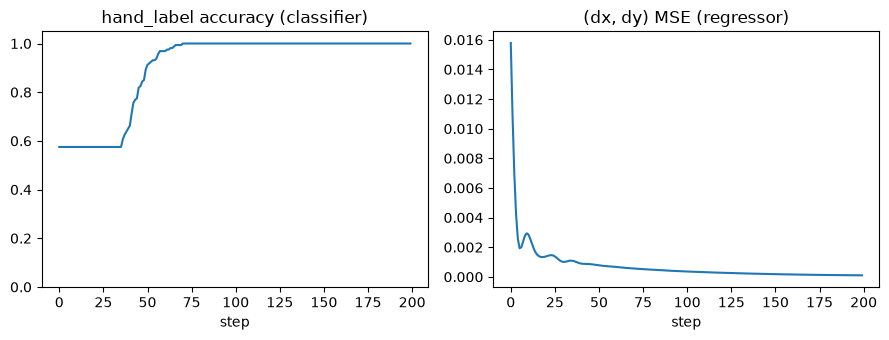

마지막 step: hand_acc=1.00, offset_mse=0.000101


In [8]:
decoder.classifier.train()
decoder.regressor.train()
classifier_opt = torch.optim.Adam(decoder.classifier.parameters(), lr=1e-3)
regressor_opt = torch.optim.Adam(decoder.regressor.parameters(), lr=1e-3)
ce_loss_fn = torch.nn.CrossEntropyLoss()
mse_loss_fn = torch.nn.MSELoss()

X_train_t = torch.from_numpy(X_train).float()
hand_train_t = torch.from_numpy(hand_train).long()
offset_train_t = torch.from_numpy(offset_train).float()

n_steps = 200
history = {"hand_acc": [], "offset_mse": []}
for step in range(n_steps):
    classifier_opt.zero_grad()
    class_logits = decoder.classifier(X_train_t)
    ce = ce_loss_fn(class_logits, hand_train_t)
    ce.backward()
    classifier_opt.step()

    regressor_opt.zero_grad()
    offset_pred = decoder.regressor(X_train_t)
    mse = mse_loss_fn(offset_pred, offset_train_t)
    mse.backward()
    regressor_opt.step()

    acc = (class_logits.argmax(dim=1) == hand_train_t).float().mean().item()
    history["hand_acc"].append(acc)
    history["offset_mse"].append(mse.item())

fig, axes = plt.subplots(1, 2, figsize=(9, 3.5))
axes[0].plot(history["hand_acc"])
axes[0].set_title("hand_label accuracy (classifier)")
axes[0].set_ylim(0, 1.05)
axes[1].plot(history["offset_mse"])
axes[1].set_title("(dx, dy) MSE (regressor)")
for ax in axes:
    ax.set_xlabel("step")
plt.tight_layout()
plt.show()

print(
    f"마지막 step: hand_acc={history['hand_acc'][-1]:.2f}, "
    f"offset_mse={history['offset_mse'][-1]:.6f}"
)

## 7. `N2O` 파이프라인으로 검증 샘플 구동

In [9]:
class ValidationSampleSignal:
    """검증 세트의 합성 신호를 순서대로 돌려주는 signal 소스."""

    def __init__(self, samples):
        self.samples = samples
        self.i = 0

    def read(self):
        sample = self.samples[self.i]
        self.i += 1
        return sample


N_VALID_SAMPLES = 3
samples = [X_valid[i] for i in range(N_VALID_SAMPLES)]
true_hand = [HAND_LABELS[hand_valid[i]] for i in range(N_VALID_SAMPLES)]
true_offset = [offset_valid[i] for i in range(N_VALID_SAMPLES)]

n2o = N2O()
n2o.signal = ValidationSampleSignal(samples)
n2o.decoder = decoder
n2o.command = command
n2o.robot.arm = SO101ArmSim()
n2o.robot.hand = AmazingHandSim()

n2o.command_config = CommandConfig()
print(n2o.command_config.verify_report(n2o))

단계      | 출력 스펙                                  |    | 단계         | 입력 스펙                  | 상태
--------+----------------------------------------+----+------------+------------------------+---
signal  | (미정)                                   | -> | decoder    | n_chans=8, n_times=250 | 미정
decoder | hand_class=0 | 1, dx=meters, dy=meters | -> | command    | (미정)                   | 미정
command | (미정)                                   | -> | robot.arm  | dx=meters, dy=meters   | 미정
command | (미정)                                   | -> | robot.hand | action=grip | release  | 미정


In [10]:
for i in range(N_VALID_SAMPLES):
    predicted = decoder(samples[i])
    print(f"--- 검증 샘플 {i + 1}/{N_VALID_SAMPLES} ---")
    print(f"  실제: hand={true_hand[i]}, offset={true_offset[i].round(4)}")
    print(
        f"  예측: hand={HAND_LABELS[predicted['hand_class']]}, "
        f"dx={predicted['dx']:.4f}, dy={predicted['dy']:.4f}"
    )
    n2o.run()

--- 검증 샘플 1/3 ---
  실제: hand=release, offset=[-0.0121 -0.0193]
  예측: hand=release, dx=-0.0137, dy=-0.0033


--- 검증 샘플 2/3 ---
  실제: hand=release, offset=[ 0.0095 -0.0046]
  예측: hand=release, dx=0.0109, dy=-0.0051


--- 검증 샘플 3/3 ---
  실제: hand=release, offset=[0.003  0.0032]
  예측: hand=release, dx=0.0060, dy=-0.0041


## 8. 가동범위 확인

IK로 풀어낸 관절 각도가 실제로 `assets/so101/mjcf`의 공식 가동범위 안에 있었는지 확인합니다 —
`SO101ArmController._solve_ik()`가 매 반복마다 이미 clamp하므로, 여기서는 그게 실제로 지켜졌는지
다시 한번 직접 확인하는 것입니다.

In [11]:
print("관절별 가동범위 확인 (공식 벤더 값 기준):")
for joint in ARM_JOINTS:
    joint_id = mujoco.mj_name2id(n2o.robot.arm.model, mujoco.mjtObj.mjOBJ_JOINT, joint)
    lo, hi = n2o.robot.arm.model.jnt_range[joint_id]
    value = n2o.robot.arm.data.qpos[joint_id]
    status = "OK" if lo - 1e-6 <= value <= hi + 1e-6 else "범위 초과"
    print(
        f"  {joint:14s}: {value:6.3f} rad   (공식 범위 [{lo:6.3f}, {hi:6.3f}])   {status}"
    )

관절별 가동범위 확인 (공식 벤더 값 기준):
  shoulder_pan  :  0.046 rad   (공식 범위 [-1.920,  1.920])   OK
  shoulder_lift : -0.699 rad   (공식 범위 [-1.745,  1.745])   OK
  elbow_flex    :  0.934 rad   (공식 범위 [-1.690,  1.690])   OK
  wrist_flex    :  0.000 rad   (공식 범위 [-1.658,  1.658])   OK
  wrist_roll    :  0.000 rad   (공식 범위 [-2.744,  2.841])   OK
  gripper       : -0.000 rad   (공식 범위 [-0.175,  1.745])   OK


## 정리

- `MixedDecoder`는 trunk를 공유하지 않는 완전히 독립적인 두 모델(`HandGestureClassifier`,
  `ArmOffsetRegressor`)을 감싸고, 여전히 순수 예측만 합니다 — `N2O`의 디코더 슬롯이 하나뿐이라, 두
  방식을 섞으려면 이렇게 한 디코더가 두 모델을 함께 들고 있어야 했지만, 모델 자체는 각자 다른
  optimizer/loss로 독립적으로 학습됩니다. `config.type = (DecoderType.CLASSIFICATION,
  DecoderType.REGRESSION)`로 표시했습니다.
- `MixedCommand`는 분류 결과(`hand_class`)를 자기 설명적인 이름(`"grip"`/`"release"`)으로 바꾸고,
  회귀 결과(`dx`, `dy`)는 raw 값이므로 `(ActionType.CARTESIAN_RELATIVE, {...})` 튜플로 태그해서
  나눠 보냅니다.
- 팔의 `Controller`가 이번 노트북의 핵심입니다 — `self.arm_sim.data.site_xpos`로 현재 위치를 직접
  읽고 `(dx, dy)` 상대 이동량을 더한 목표점을 감쇠 최소제곱 IK로 관절 각도로 직접 풀어내며, 매
  반복마다 공식 가동범위로 clamp합니다. 손의 `Controller`는 `04`번과 동일한 이산 조회 테이블입니다.
- `04`(전부 분류) · `05`(전부 회귀, 절대 관절각) · `06`(혼합 + 상대 이동 + IK), 세 노트북 모두 같은
  `Decoder`/`Command`/`Controller` 3단 구조를 공유합니다 — 디코더가 무엇을 예측하든, 그리고 팔을
  어떤 방식으로 구동하든(이산 자세 선택이든, 절대 관절각 회귀든, 상대 이동 + IK든), `N2O.run()`의
  코드는 전혀 바뀌지 않습니다.
- `n2o.robot.arm.LeRobotSO101`과 `n2o.robot.hand.AmazingHand`는 이 노트북에서 한 번도
  인스턴스화되지 않았습니다 — 물리적으로 연결된 실제 AmazingHand는 전혀 건드리지 않았습니다.